# **Global Wheat Detection - FasterRCNN**
***Ido Zada***

***Roman Prasolov***

Following the existing train.csv file and multiple reading of different models we realized that we had to use FasterRCNN model in order to solve the what was expected from us in this kind of competition.

We'll explain How this model works and what kind of parameters we should have.

# **Architecture of FasterRCNN**
The architecture of Faster R-CNN is complex because it has several moving parts.

It all starts with an image, from which we want to obtain:


1.   a list of bounding boxes.
2.   a label assigned to each bounding box.
3.   a probability for each label and bounding box.


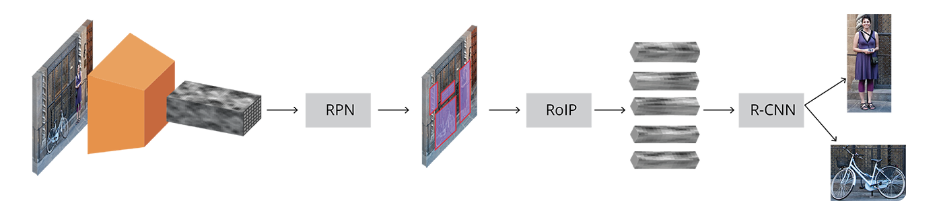

**Base network**



The first step is using a CNN pretrained for the task of classification and using the output of an intermediate layer.

In this notebook we were using resnet50-fpn.

FPN composes of a bottom-up and a top-down pathway. The bottom-up pathway is the usual convolutional network for feature extraction.

ResNet architectures have mostly replaced VGG as a base network for extracting features.

The obvious advantage of ResNet over VGG is that it is bigger, hence it has more capacity to actually learn what is needed. 

This is true for the classification task and should be equally true in the case of object detection.

**Anchors**

Our objective is to find bounding boxes in the image. These have rectangular shape and can come in different sizes and aspect ratios. Imagine we were trying to solve the problem knowing beforehand that there are two objects on the image. The first idea that comes to mind is to train a network that returns 8 values: two `[xmin, ymin, xmax, ymax]`
tuples defining a bounding box for each object. This approach has some fundamental problems.

It turns out that there is a simpler approach to predicting bounding boxes by learning to predict offsets from reference boxes. 

We take a reference box x_center, y_center, width, height and learn to predict 

Δ
​x
​center
​​ 
​​, Δ 
​y
​center 
​​, Δ 
​width
​​, Δ
​height, which are usually small values that tweak the reference box to better fit what we want.

**Region Proposal Network**

The RPN takes all the reference boxes (anchors) and outputs a set of good proposals for objects. It does this by having two different outputs for each of the anchors.

The RPN is implemented efficiently in a fully convolutional way, using the convolutional feature map returned by the base network as an input.

For the classification layer, we output two predictions per anchor: the score of it being background (not an object) and the score of it being foreground (an actual object).

For the regression, or bounding box adjustment layer, we output 4 predictions: the deltas 

Δ
​x
​center
​​ 
​​, Δ
​y
​center
​​ 
​​, Δ
​width
​​, Δ
​height
​​ which we will apply to the anchors to get the final proposals.

Using the final proposal coordinates and their “objectness” score we then have a good set of proposals for objects.


**Training, target and loss functions**

The RPN does two different type of predictions: the binary classification and the bounding box regression adjustment.

For training, we take all the anchors and put them into two different categories. Those that overlap a ground-truth object with an Intersection over Union (IoU) bigger than 0.5 are considered “foreground” and those that don’t overlap any ground truth object or have less than 0.1 IoU with ground-truth objects are considered “background”.

**Region of Interest Pooling**

We have a bunch of object proposals with no class assigned to them. Our next problem to solve is how to take these bounding boxes and classify them into our desired categories.

Faster R-CNN tries to solve, or at least mitigate, this problem by reusing the existing convolutional feature map. This is done by extracting fixed-sized feature maps for each proposal using region of interest pooling. Fixed size feature maps are needed for the R-CNN in order to classify them into a fixed number of classes.

**Region-based Convolutional Neural Network**

Region-based convolutional neural network (R-CNN) is the final step in Faster R-CNN’s pipeline. After getting a convolutional feature map from the image, using it to get object proposals with the RPN and finally extracting features for each of those proposals (via RoI Pooling), we finally need to use these features for classification. R-CNN tries to mimic the final stages of classification CNNs where a fully-connected layer is used to output a score for each possible object class.

R-CNN has two different goals:

1.   Classify proposals into one of the classes, plus a background class (for removing bad proposals). 

2.   Better adjust the bounding box for the proposal according to the predicted class.


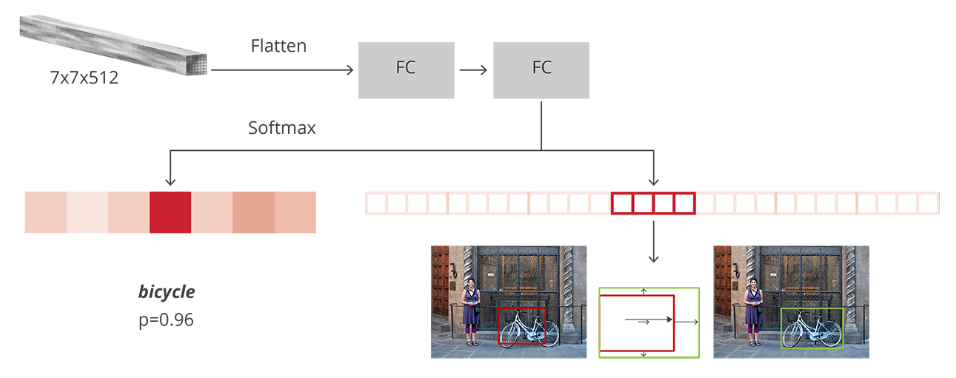

**Training and targets**

Targets for R-CNN are calculated in almost the same way as the RPN targets, but taking into account the different possible classes. We take the proposals and the ground-truth boxes, and calculate the IoU between them.

Those proposals that have a IoU greater than threshold (most of the time we will choose the defualt parameter 0.5) with any ground truth box get assigned to that ground truth. Those values are hyperparameters that can be tuned to better fit the type of objects that you are trying to find.

The targets for the bounding box regression are calculated as the offset between the proposal and its corresponding ground-truth box, only for those proposals that have been assigned a class based on the IoU threshold.

After training the model we end up with four different losses.
They are combined using a weighted sum. This is because we may want to give classification losses more weight relative to regression ones, or maybe give R-CNN losses more power over the RPN's.

**Evaluation**

The evaluation is done using the standard Mean Average Precision (mAP) at some specific IoU threshold. mAP is a metric that comes from information retrieval, and is commonly used for calculating the error in ranking problems and for evaluating object detection problems.

The important takeway is that mAP penalizes you when you miss a box that you should have detected, as well as when you detect something that does not exist or detect the same thing multiple times.

In [ ]:
!pip install -U git+https://github.com/albu/albumentations

In [ ]:
!pip install ensemble-boxes

In [ ]:
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
import torch.utils as utils
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.optim
import os
import glob
from tqdm.auto import tqdm
from tqdm import tqdm_notebook
import random
import time
from datetime import datetime
from ensemble_boxes import *
from itertools import product
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from albumentations.pytorch.transforms import ToTensorV2
from albumentations import (Blur, MotionBlur, MedianBlur, GaussianBlur,
                            VerticalFlip, HorizontalFlip, IAASharpen,
                            OneOf, Compose , BboxParams, Resize ,RandomSizedCrop,
                            ToGray , Cutout , HueSaturationValue , RandomBrightnessContrast)

# **Path directories**

In [ ]:
DIR_PATH = '/content/drive/My Drive/Global Wheat Detection/'
dir = glob.glob(os.path.join('/content/drive/My Drive/Global Wheat Detection/*'))
dir.sort(reverse=True)
train_paths = glob.glob(os.path.join(dir[1] , '*'))
test_paths = glob.glob(os.path.join(dir[2] , '*'))

# **Read Dataframe**

In [ ]:
df = pd.read_csv(dir[0])
bboxs = np.stack(df['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
for i, column in enumerate(['x', 'y', 'w', 'h']):
    df[column] = bboxs[:,i]
df.drop(columns=['bbox'], inplace=True)

In [ ]:
df.head()

,image_id,width,height,source,x,y,w,h
0,b6ab77fd7,1024,1024,usask_1,834.0,222.0,56.0,36.0
1,b6ab77fd7,1024,1024,usask_1,226.0,548.0,130.0,58.0
2,b6ab77fd7,1024,1024,usask_1,377.0,504.0,74.0,160.0
3,b6ab77fd7,1024,1024,usask_1,834.0,95.0,109.0,107.0
4,b6ab77fd7,1024,1024,usask_1,26.0,144.0,124.0,117.0


# **Help functions**

In [ ]:
def show_image(image, boxes, title):
  fig, ax = plt.subplots(1, 1, figsize=[6, 6])
  boxes = boxes.astype(np.int32)
  for box in boxes:
      cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]),  int(box[3])), (1, 1, 0), 3)
  ax.set_title(title) 
  ax.set_axis_off()
  ax.imshow(image);


def load_image_and_boxes(image_path):
  image_id = image_path.split('/')[-1].split('.')[0]
  image = cv2.imread(image_path, cv2.IMREAD_COLOR)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
  image /= 255.0
  records = df[df['image_id'] == image_id]
  boxes = records[['x', 'y', 'w', 'h']].values
  boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
  boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
  return image, boxes


def images_after_augmentation(original_image, boxes, augmentation):
    aug_image = original_image.copy()
    boxes = boxes.astype(np.int32)
    if isinstance(augmentation , VerticalFlip) or isinstance(augmentation , HorizontalFlip):
      for box in boxes:
          cv2.rectangle(aug_image, (box[0], box[1]), (box[2],  box[3]), (1, 1, 0), 2)
      sample = {'image': aug_image, 'label': 'label'}
      compose = Compose([augmentation], p=1)
      aug_image = compose(**sample)['image']
    else:
      sample = {'image': aug_image, 'label': 'label'}
      compose = Compose([augmentation], p=1)
      aug_image = compose(**sample)['image']
      for box in boxes:
          cv2.rectangle(aug_image, (box[0], box[1]), (box[2],  box[3]), (1, 1, 0), 2)
    plt.figure(figsize=[12, 12])
    for i in range(len([original_image, aug_image])):
            image = [original_image, aug_image][i]
            plt.subplot(1, 2, i+1)
            plt.title(['Original Image', 'After Augmentaion'][i])
            plt.axis("off")
            plt.imshow(image)
    plt.show()


# Functions to visualize bounding boxes and class labels on an image. 
# Based on https://github.com/facebookresearch/Detectron/blob/master/detectron/utils/vis.py
def visualize(figure=(16,8),**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=figure)
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()


BOX_COLOR = (255, 255, 0)


def visualize_bbox(img, bbox, color=BOX_COLOR, thickness=3):
    xmin, ymin, xmax, ymax = bbox
    xmin, ymin, xmax, ymax =  int(xmin), int(ymin), int(xmax), int(ymax)
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color=BOX_COLOR, thickness=thickness)
    return img

def visualizeTarget(image, target , visualize_data_loader = True):
  boxes = target['boxes']
  boxes = boxes.astype(np.int32)
  if visualize_data_loader:
    if not type(boxes).__module__ == np.__name__:
      boxes = boxes.numpy()
    image = image.numpy()
    image = np.transpose(image,(1,2,0))
  img = image.copy()
  for idx, bbox in enumerate(boxes):
      img = visualize_bbox(img, bbox)
  return img

# **Examples**

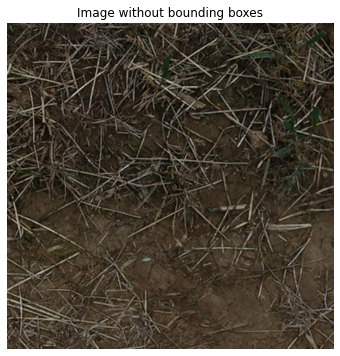

In [ ]:
image_id = '8425a537b.jpg'
image_path = glob.glob(os.path.join(dir[1] , image_id))
image , boxes  = load_image_and_boxes(image_path[0])
show_image(image, boxes, "Image without bounding boxes")

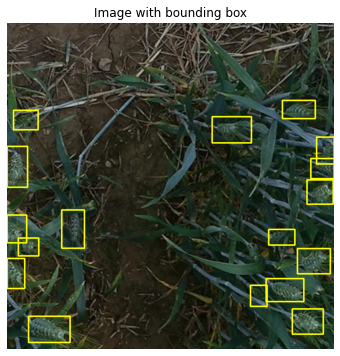

In [ ]:
image_id = 'b3c96d5ad.jpg'
image_path = glob.glob(os.path.join(dir[1] , image_id))
image , boxes  = load_image_and_boxes(image_path[0])
show_image(image, boxes, "Image with bounding box")

# **Examples of some augmentations that we will use for our train** 

## **Blur**

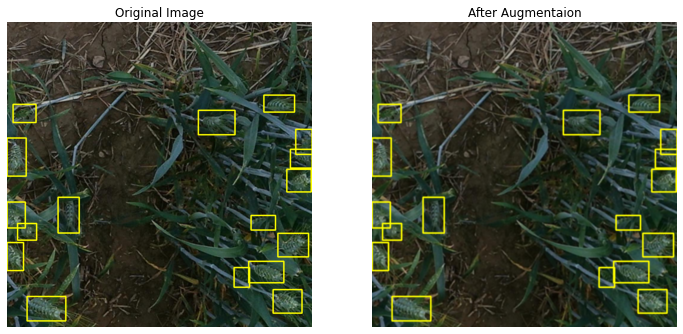

In [ ]:
images_after_augmentation(image, boxes, Blur(blur_limit=7 ,p=1))

## **Vertical Flip**

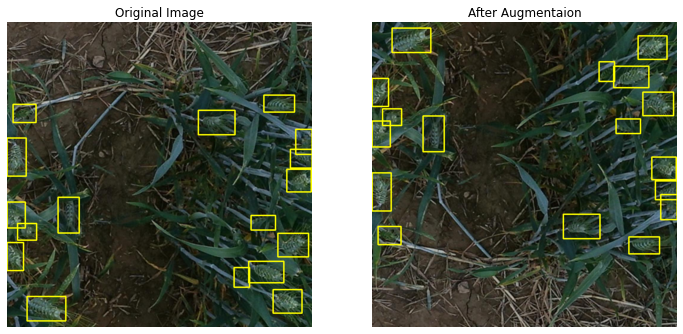

In [ ]:
images_after_augmentation(image, boxes, VerticalFlip(p=1))

## **Horizontal Flip**

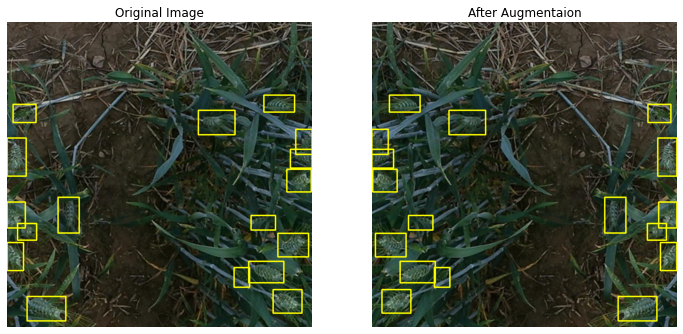

In [ ]:
images_after_augmentation(image, boxes, HorizontalFlip(p=1))

# **Cutout**

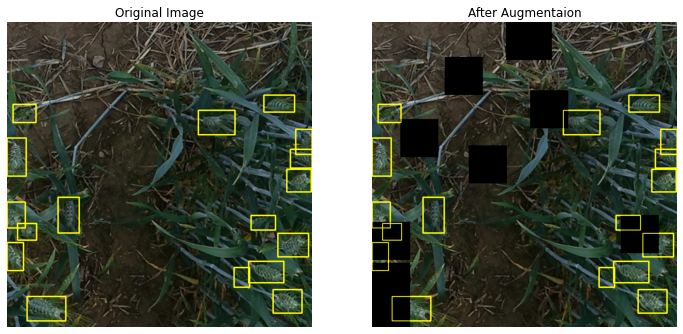

In [ ]:
images_after_augmentation(image, boxes, Cutout(num_holes=10, max_h_size=128, max_w_size=128, fill_value=0, p=1.0))

# **Wheat dataset**

In [ ]:
class WheatDataset(Dataset):
  def __init__(self , paths , dataframe ,  transforms = None):
    super().__init__()
    self.paths = paths
    self.dataframe = dataframe
    self.transforms = transforms

  def __getitem__(self, index):
    path_image = self.paths[index]

    image, boxes = self.load_image_and_boxes(index)
       
    labels = torch.ones((boxes.shape[0],), dtype=torch.int64)
 
    target = {}
    target['boxes'] = boxes
    target['labels'] = labels
    target['image_id'] = torch.tensor([index])

    if self.transforms:
      sample = self.transforms(**{
              'image': image,
              'bboxes': target['boxes'],
              'labels': labels
          })
      image = sample["image"]
      target['bboxes'] = torch.as_tensor(sample['bboxes'], dtype=torch.float32)
      target['bboxes'] =  target['bboxes'].reshape(-1, 4)
      target["boxes"] = target["bboxes"]
      del target['bboxes']
    else:
      target['boxes'] = torch.as_tensor(target['boxes'], dtype=torch.float32)
      target['boxes'] =  target['boxes'].reshape(-1, 4)
    image = np.transpose(image,(2,0,1))
    image = torch.from_numpy(image)
    return image, target, path_image

  def __len__(self):
      return len(self.paths)

  def load_image_and_boxes(self, index):
        path_image = self.paths[index]
        image_id = path_image.split('/')[-1].split('.')[0]
        image = cv2.imread(path_image, cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image /= 255.0
        records = self.dataframe[self.dataframe['image_id'] == image_id]
        boxes = records[['x', 'y', 'w', 'h']].to_numpy()
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
        return image, boxes

**Split 80% of data to train and 20% to validation**

In [ ]:
train_path , valid_path = train_test_split(train_paths,test_size=0.2)

# **Augmentations**

In [ ]:
transforms_train = Compose([IAASharpen(p = 0.5), RandomSizedCrop(min_max_height=(800, 800), height=1024, width=1024, p=0.5),ToGray(p=0.01),
                            Cutout(num_holes=8, max_h_size=64, max_w_size=64, fill_value=0, p=0.5),
                            OneOf([HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit= 0.2, val_shift_limit=0.2, p=0.9),
                                    RandomBrightnessContrast(brightness_limit=0.2,contrast_limit=0.2, p=0.9)]),
                            OneOf([Blur(blur_limit=3), MotionBlur(blur_limit=3), MedianBlur(blur_limit=3)]),
                            OneOf([VerticalFlip(), HorizontalFlip()])
                            ],p = 0.9,bbox_params=BboxParams(format='pascal_voc', min_area=0, 
                                               min_visibility=0, label_fields=['labels']))

# **Dataloader**

In [ ]:
def collate_fn(batch):
  return tuple(zip(*batch))

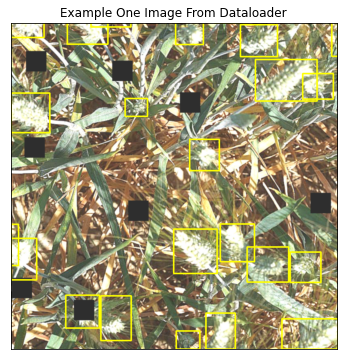

In [ ]:
bs = 8
num_workers = 8
train_set = WheatDataset(train_path,df , transforms=transforms_train)
valid_set = WheatDataset(valid_path,df)

train_loader = DataLoader(train_set,batch_size = bs ,shuffle = True,collate_fn=collate_fn , num_workers=num_workers)
valid_loader = DataLoader(valid_set,batch_size = bs ,shuffle = True,collate_fn=collate_fn , num_workers=num_workers)

images , targets , path_images = next(iter(train_loader))
img = visualizeTarget(images[0],targets[0])
visualize(figure=(6,6),Example_one_image_from_dataloader = img)

# **Train/Validation**

In [ ]:
class Calculator(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
class Training:
    
    def __init__(self, model, device, config):
        self.config = config
        self.epoch = 0

        self.base_dir = f'{config.folder}'
        if not os.path.exists(self.base_dir):
            os.makedirs(self.base_dir)
        
        self.best_calc_loss = 10**5

        self.model = model
        self.device = device

        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=config.lr)
        self.scheduler = config.SchedulerClass(self.optimizer, **config.scheduler_params)


    def train_loop(self, train_loader, validation_loader):
        for e in range(self.config.n_epochs):
            if self.config.verbose:
                lr = self.optimizer.param_groups[0]['lr']
                timestamp = datetime.utcnow().isoformat()
                print(f'\n{timestamp}\nLR: {lr}')

            t = time.time()
            calc_loss = self.train_one_epoch(train_loader)
            self.config.epoch.append(e)
            self.config.train_loss.append(calc_loss.avg)
            print(f'Train. Epoch: {self.epoch}, Loss: {calc_loss.avg:.5f}, time: {(time.time() - t):.5f}')
            self.save_model(f'{self.base_dir}/last-epoch.bin')

            t = time.time()
            calc_loss = self.valid_one_epoch(validation_loader)
            self.config.valid_loss.append(calc_loss.avg)
            print(f'Val. Epoch: {self.epoch}, Loss: {calc_loss.avg:.5f}, time: {(time.time() - t):.5f}')
            if calc_loss.avg < self.best_calc_loss:
                self.best_calc_loss = calc_loss.avg
                self.model.eval()
                self.save_model(f'{self.base_dir}/best-model-{str(self.epoch).zfill(4)}epoch.bin')

            if self.config.validation_scheduler:
                self.scheduler.step(metrics=calc_loss.avg)

            self.epoch += 1


    def train_one_epoch(self, train_loader):
      self.model.train()
      calc_loss = Calculator()
      t = time.time()
      for images, targets, image_ids in tqdm_notebook(train_loader):
        batch_size = len(images)
        images = list(image.to(device).float() for image in images)
        target_res = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = self.model(images, target_res)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        self.optimizer.zero_grad()
        losses.backward()
        self.optimizer.step()
        calc_loss.update(loss_value, batch_size)

        if self.config.step_scheduler:
          self.scheduler.step()

      return calc_loss


    def valid_one_epoch(self, val_loader):
        self.model.train()
        calc_loss = Calculator()
        t = time.time()
        for images, targets, image_ids in tqdm_notebook(val_loader):
            with torch.no_grad():
                batch_size = len(images)
                images = list(image.to(device).float() for image in images)
                target_res = [{k: v.to(device) for k, v in t.items()} for t in targets]
                loss_dict = self.model(images , target_res)
                losses = sum(loss for loss in loss_dict.values())
                loss_value = losses.item()
                calc_loss.update(loss_value, batch_size)

        return calc_loss


    def save_model(self, path):
        self.model.eval()
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'best_calc_loss': self.best_calc_loss,
            'epoch': self.epoch,
        }, path)


    def load_model(self, path):
        model = torch.load(path)
        self.model.load_state_dict(model['model_state_dict'])
        self.optimizer.load_state_dict(model['optimizer_state_dict'])
        self.scheduler.load_state_dict(model['scheduler_state_dict'])
        self.best_calc_loss = model['best_calc_loss']
        self.epoch = model['epoch'] + 1


    def display_graph(self):
      plt.plot(self.config.epoch, self.config.train_loss)
      plt.plot(self.config.epoch , self.config.valid_loss)
      plt.xlabel('Epochs')
      plt.ylabel('Loss')
      plt.legend(["Train", "Validation"])

# **FasterRCNN Model**
`num_classes = 2` - class 1 for Wheat and 0 for background  





In [ ]:
def get_model(num_classes = 2):
  fpn_resnet = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
  in_features = fpn_resnet.roi_heads.box_predictor.cls_score.in_features
  fpn_resnet.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
  fpn_resnet._name_ = "fpn_resnet"
  return fpn_resnet

In [ ]:
class GlobalParametersTrain:
    lr = 0.0002
    n_epochs = 40 

    train_loss = []
    valid_loss = []
    epoch = []
    
    folder = '/content/drive/My Drive/Global Wheat Detection/fasterrcnn_resnet50_fpn'

    verbose = True
    verbose_step = 10

    step_scheduler = False 
    validation_scheduler = True 
    
    SchedulerClass = torch.optim.lr_scheduler.ReduceLROnPlateau
    scheduler_params = dict(mode='min',factor=0.5,patience=1,verbose=False, threshold=0.0001,threshold_mode='abs',cooldown=0, min_lr=1e-8,eps=1e-08)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth




2020-08-06T15:59:45.488838
LR: 0.0002



Train. Epoch: 0, Loss: 1.03836, time: 394.89939



Val. Epoch: 0, Loss: 0.86191, time: 54.09821

2020-08-06T16:07:24.690687
LR: 0.0002



Train. Epoch: 1, Loss: 0.90531, time: 339.14648



Val. Epoch: 1, Loss: 0.80026, time: 49.98854

2020-08-06T16:14:01.092747
LR: 0.0002



Train. Epoch: 2, Loss: 0.87111, time: 337.45619



Val. Epoch: 2, Loss: 0.81968, time: 49.85749

2020-08-06T16:20:30.628188
LR: 0.0002



Train. Epoch: 3, Loss: 0.85227, time: 337.29396



Val. Epoch: 3, Loss: 0.75430, time: 49.93150

2020-08-06T16:27:05.004063
LR: 0.0002



Train. Epoch: 4, Loss: 0.83717, time: 337.67808



Val. Epoch: 4, Loss: 0.77058, time: 49.91191

2020-08-06T16:33:34.893969
LR: 0.0002



Train. Epoch: 5, Loss: 0.83413, time: 336.97583



Val. Epoch: 5, Loss: 0.74163, time: 49.71373

2020-08-06T16:40:06.596707
LR: 0.0002



Train. Epoch: 6, Loss: 0.81591, time: 338.48958



Val. Epoch: 6, Loss: 0.72267, time: 50.07818

2020-08-06T16:46:42.204561
LR: 0.0002



Train. Epoch: 7, Loss: 0.80874, time: 338.77066



Val. Epoch: 7, Loss: 0.74061, time: 50.27879

2020-08-06T16:53:13.694460
LR: 0.0002



Train. Epoch: 8, Loss: 0.80365, time: 336.96101



Val. Epoch: 8, Loss: 0.73463, time: 49.95092

2020-08-06T16:59:42.875694
LR: 0.0001



Train. Epoch: 9, Loss: 0.76457, time: 338.91486



Val. Epoch: 9, Loss: 0.69591, time: 50.66602

2020-08-06T17:06:16.988876
LR: 0.0001



Train. Epoch: 10, Loss: 0.75978, time: 339.22467



Val. Epoch: 10, Loss: 0.68668, time: 49.52214

2020-08-06T17:12:52.446781
LR: 0.0001



Train. Epoch: 11, Loss: 0.75718, time: 336.46790



Val. Epoch: 11, Loss: 0.69285, time: 49.43824

2020-08-06T17:19:21.046287
LR: 0.0001



Train. Epoch: 12, Loss: 0.75373, time: 336.04135



Val. Epoch: 12, Loss: 0.68812, time: 49.68526

2020-08-06T17:25:49.015580
LR: 5e-05



Train. Epoch: 13, Loss: 0.73018, time: 337.61034



Val. Epoch: 13, Loss: 0.68128, time: 50.17234

2020-08-06T17:32:21.213920
LR: 5e-05



Train. Epoch: 14, Loss: 0.72373, time: 339.63545



Val. Epoch: 14, Loss: 0.68244, time: 50.31459

2020-08-06T17:38:54.050894
LR: 5e-05



Train. Epoch: 15, Loss: 0.72075, time: 338.35730



Val. Epoch: 15, Loss: 0.68519, time: 49.97564

2020-08-06T17:45:24.621769
LR: 2.5e-05



Train. Epoch: 16, Loss: 0.70951, time: 336.23573



Val. Epoch: 16, Loss: 0.67183, time: 49.57354

2020-08-06T17:51:54.587292
LR: 2.5e-05



Train. Epoch: 17, Loss: 0.70688, time: 336.42143



Val. Epoch: 17, Loss: 0.67644, time: 50.10132

2020-08-06T17:58:23.894613
LR: 2.5e-05



Train. Epoch: 18, Loss: 0.70246, time: 338.41153



Val. Epoch: 18, Loss: 0.66909, time: 50.15768

2020-08-06T18:04:56.848254
LR: 2.5e-05



Train. Epoch: 19, Loss: 0.70279, time: 338.82405



Val. Epoch: 19, Loss: 0.66338, time: 50.40729

2020-08-06T18:11:30.582273
LR: 2.5e-05



Train. Epoch: 20, Loss: 0.69931, time: 338.71927



Val. Epoch: 20, Loss: 0.66567, time: 50.64577

2020-08-06T18:18:02.380970
LR: 2.5e-05



Train. Epoch: 21, Loss: 0.69554, time: 339.02777



Val. Epoch: 21, Loss: 0.66936, time: 50.48437

2020-08-06T18:24:34.346827
LR: 1.25e-05



Train. Epoch: 22, Loss: 0.69395, time: 337.86614



Val. Epoch: 22, Loss: 0.67181, time: 49.71035

2020-08-06T18:31:04.432406
LR: 1.25e-05



Train. Epoch: 23, Loss: 0.68876, time: 336.37795



Val. Epoch: 23, Loss: 0.67321, time: 49.68862

2020-08-06T18:37:32.803915
LR: 6.25e-06



Train. Epoch: 24, Loss: 0.68562, time: 336.33164



Val. Epoch: 24, Loss: 0.66400, time: 50.21420

2020-08-06T18:44:01.627895
LR: 6.25e-06



Train. Epoch: 25, Loss: 0.68663, time: 338.05908



Val. Epoch: 25, Loss: 0.66396, time: 50.30988

2020-08-06T18:50:32.299620
LR: 3.125e-06



Train. Epoch: 26, Loss: 0.68459, time: 337.86643



Val. Epoch: 26, Loss: 0.66262, time: 49.56316

2020-08-06T18:57:04.082674
LR: 3.125e-06



Train. Epoch: 27, Loss: 0.68497, time: 337.73474



Val. Epoch: 27, Loss: 0.66694, time: 50.14875

2020-08-06T19:03:34.284686
LR: 3.125e-06



Train. Epoch: 28, Loss: 0.68768, time: 337.15825



Val. Epoch: 28, Loss: 0.66662, time: 49.84312

2020-08-06T19:10:03.616887
LR: 1.5625e-06



Train. Epoch: 29, Loss: 0.67864, time: 337.11238



Val. Epoch: 29, Loss: 0.66774, time: 49.93768

2020-08-06T19:16:32.905148
LR: 1.5625e-06



Train. Epoch: 30, Loss: 0.68333, time: 335.94082



Val. Epoch: 30, Loss: 0.66291, time: 50.33139

2020-08-06T19:23:01.390695
LR: 7.8125e-07



Train. Epoch: 31, Loss: 0.67925, time: 337.78602



Val. Epoch: 31, Loss: 0.66515, time: 50.18166

2020-08-06T19:29:31.581647
LR: 7.8125e-07



Train. Epoch: 32, Loss: 0.67845, time: 338.65860



Val. Epoch: 32, Loss: 0.66412, time: 50.55551

2020-08-06T19:36:03.102370
LR: 3.90625e-07



Train. Epoch: 33, Loss: 0.68183, time: 338.82973



Val. Epoch: 33, Loss: 0.66304, time: 50.51761

2020-08-06T19:42:34.762605
LR: 3.90625e-07



Train. Epoch: 34, Loss: 0.68330, time: 338.98616



Val. Epoch: 34, Loss: 0.66518, time: 50.51092

2020-08-06T19:49:06.565988
LR: 1.953125e-07



Train. Epoch: 35, Loss: 0.67951, time: 338.02185



Val. Epoch: 35, Loss: 0.66315, time: 50.75663

2020-08-06T19:55:37.786567
LR: 1.953125e-07



Train. Epoch: 36, Loss: 0.68227, time: 339.18618



Val. Epoch: 36, Loss: 0.66113, time: 50.60521

2020-08-06T20:02:12.071277
LR: 1.953125e-07



Train. Epoch: 37, Loss: 0.68365, time: 339.94884



Val. Epoch: 37, Loss: 0.66397, time: 50.47404

2020-08-06T20:08:44.902170
LR: 1.953125e-07



Train. Epoch: 38, Loss: 0.67743, time: 338.87554



Val. Epoch: 38, Loss: 0.66394, time: 50.86409

2020-08-06T20:15:17.377114
LR: 9.765625e-08



Train. Epoch: 39, Loss: 0.67668, time: 338.86852



Val. Epoch: 39, Loss: 0.66405, time: 50.62242


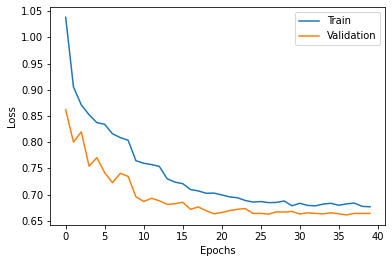

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
training = Training(model=get_model().to(device), device=device, config=GlobalParametersTrain)
training.train_loop(train_loader, valid_loader)
training.display_graph()

# **Load Best Model**

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
training = Training(model=get_model(2).to(device), device=device, config=GlobalParametersTrain)

training.load_model('/content/drive/My Drive/Global Wheat Detection/fasterrcnn_resnet50_fpn/Notebook_2_Score_0.7112/best-model-0027epoch.bin')
model = training.model
model.eval()

In [ ]:
def make_predictions(images ,  score_threshold=0.22):
    images = list(img.to(device) for img in images)
    predictions = []
    with torch.no_grad():
        outputs = model(images)
        for i in range(len(images)):
            boxes = outputs[i]['boxes'].data.detach().cpu().numpy()    
            scores = outputs[i]['scores'].data.detach().cpu().numpy()
            labels = outputs[i]['labels'].detach().cpu().numpy()
            indexes = np.where(scores > score_threshold)[0]
            boxes = boxes[indexes]
            predictions.append({
                'boxes': boxes[indexes],
                'scores': scores[indexes],
                'labels': labels[indexes],
            })
    return predictions

### **Example ground truth boxes and predict boxes**

In [ ]:
valid_set = WheatDataset(valid_path,df)
valid_loader = DataLoader(valid_set,batch_size = 4 ,shuffle = True,collate_fn=collate_fn , num_workers=num_workers)

for j, (images, targets , image_ids) in enumerate(valid_loader):
    break
predictions = make_predictions(images)

i = 0
sample = images[i].permute(1,2,0).cpu().numpy()

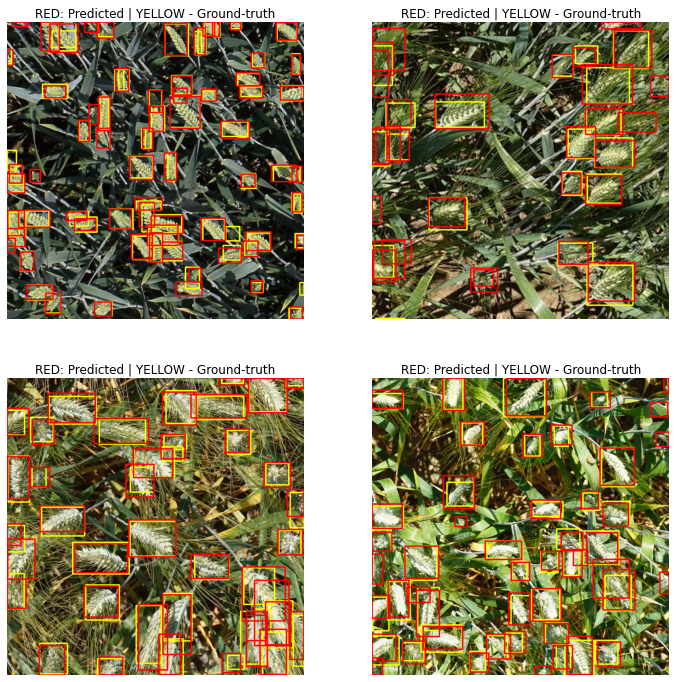

In [ ]:
def draw_gt_pred_images(sample_id, preds, gt_boxes):
    sample = cv2.imread(f'{dir[1]}/{sample_id}.jpg', cv2.IMREAD_COLOR)
    sample = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)

    preds = preds.astype(np.int32)
    gt_boxes = gt_boxes.astype(np.int32)

    #Draw ground truth boxes
    for gt_box in gt_boxes:    
        cv2.rectangle(sample,(gt_box[0], gt_box[1]),(gt_box[2], gt_box[3]),(255, 255, 0), 3)
    
    #Draw predict boxes
    for pred_box in preds:
        cv2.rectangle(sample,(int(pred_box[0]), int(pred_box[1])),(int(pred_box[2]), int(pred_box[3])),(255, 0, 0), 3)
    
    return sample


fig = plt.figure(figsize = [12,12])
for i in range(4):
  image_id = image_ids[i].split('/')[-1][:-4]
  sample = draw_gt_pred_images(image_id, predictions[i]['boxes'], targets[i]['boxes'].numpy())
  fig.add_subplot(2,2,i+1)
  plt.title(f'RED: Predicted | YELLOW - Ground-truth')
  plt.axis("off")
  plt.imshow(sample)
plt.show()

# **Weighted Boxes Fusion**
**Why WBF can be better than NMS or SoftNMS?**

Both NMS and Soft-NMS exclude some boxes, but WBF
uses information from all boxes. It can fix some cases where
all boxes are predicted inaccurate by all models. NMS will
leave only one inaccurate box, while WBF will fix it using
information from all 3 boxes. 

See the example in Fig. 1 ,
red predictions, blue ground truth.

*Reference* : https://arxiv.org/pdf/1910.13302.pdf


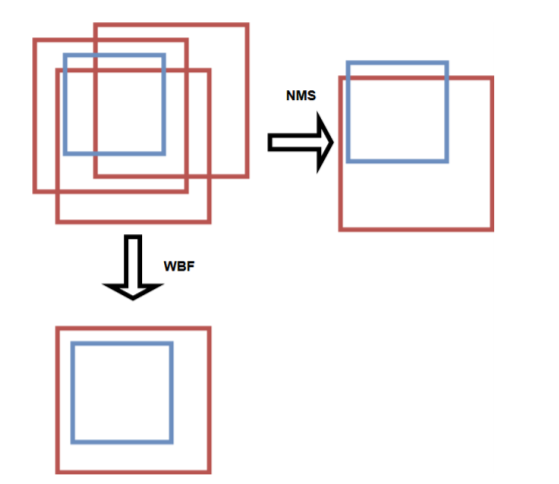

In [ ]:
def run_wbf(predictions,weights=None,image_size=1024,iou_thr=0.5,skip_box_thr=0.43):
    boxes_list = [(pred["boxes"] / (image_size-1)).tolist() for pred in predictions]
    scores_list = [pred["scores"].tolist() for pred in predictions]
    labels_list = [np.ones(len(score)).astype(int).tolist() for score in scores_list]
    boxes, scores, labels = weighted_boxes_fusion(boxes_list, scores_list, labels_list, weights=weights, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    return boxes, scores, labels

# **Test Time Augmentation**

WBF method could be rephrased as a merging process of multiple predictions. These multiple predictions can come from different models or a single model using TTA.
Indeed, the whole of TTA (Test-Time Augmentation) is to make our single model make multiple predictions for a single having that have been augmented. All these predictions are then merged using WBF even if they come from a single model.

This is how it would be used:

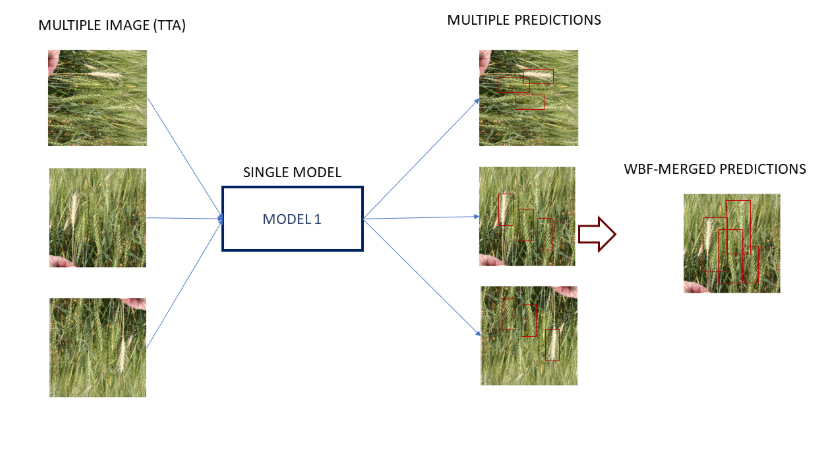

### **TTA Class**

In [ ]:
class BaseWheatTTA:
    """ author: @shonenkov """
    image_size = 512

    def augment(self, image):
        raise NotImplementedError
    
    def batch_augment(self, images):
        raise NotImplementedError
    
    def deaugment_boxes(self, boxes):
        raise NotImplementedError

class TTAHorizontalFlip(BaseWheatTTA):
    """ author: @shonenkov """

    def augment(self, image):
        return image.flip(1)
    
    def batch_augment(self, images):
        return images.flip(2)
    
    def deaugment_boxes(self, boxes):
        boxes[:, [1,3]] = self.image_size - boxes[:, [3,1]]
        return boxes

class TTAVerticalFlip(BaseWheatTTA):
    """ author: @shonenkov """
    
    def augment(self, image):
        return image.flip(2)
    
    def batch_augment(self, images):
        return images.flip(3)
    
    def deaugment_boxes(self, boxes):
        boxes[:, [0,2]] = self.image_size - boxes[:, [2,0]]
        return boxes
    
class TTARotate90(BaseWheatTTA):
    """ author: @shonenkov """
    
    def augment(self, image):
        return torch.rot90(image, 1, (1, 2))

    def batch_augment(self, images):
        return torch.rot90(images, 1, (2, 3))
    
    def deaugment_boxes(self, boxes):
        res_boxes = boxes.copy()
        res_boxes[:, [0,2]] = self.image_size - boxes[:, [1,3]]
        res_boxes[:, [1,3]] = boxes[:, [2,0]]
        return res_boxes

class TTACompose(BaseWheatTTA):
    """ author: @shonenkov """
    def __init__(self, transforms):
        self.transforms = transforms
        
    def augment(self, image):
        for transform in self.transforms:
            image = transform.augment(image)
        return image
    
    def batch_augment(self, images):
        for transform in self.transforms:
            images = transform.batch_augment(images)
        return images
    
    def prepare_boxes(self, boxes):
        result_boxes = boxes.copy()
        result_boxes[:,0] = np.min(boxes[:, [0,2]], axis=1)
        result_boxes[:,2] = np.max(boxes[:, [0,2]], axis=1)
        result_boxes[:,1] = np.min(boxes[:, [1,3]], axis=1)
        result_boxes[:,3] = np.max(boxes[:, [1,3]], axis=1)
        return result_boxes
    
    def deaugment_boxes(self, boxes):
        for transform in self.transforms[::-1]:
            boxes = transform.deaugment_boxes(boxes)
        return self.prepare_boxes(boxes)

In [ ]:
tta_transforms = []
for tta_combination in product([TTAHorizontalFlip(), None], [TTAVerticalFlip(), None],[TTARotate90(), None]):
    tta_transforms.append(TTACompose([tta_transform for tta_transform in tta_combination if tta_transform]))

In [ ]:
def display_tta(path):
    iou_thr = 0.4
    detection_threshold = 0.5
    model.cuda()
    model.eval()

    img = plt.imread(path).astype(np.float32)
    img /= 255.0

    t = Compose([Resize(width=512,height=512),ToTensorV2()])
    data = { "image": img}
    data = t(**data)
    
    img_tensor = data["image"]
    img_tensor = img_tensor.squeeze(0)
    selected_tta = random.choice(tta_transforms)
    
    tta_image = selected_tta.augment(img_tensor)
    outputs = model(tta_image.unsqueeze(0).cuda())
    boxes = outputs[0]['boxes'].data.detach().cpu().numpy()
    scores = outputs[0]['scores'].data.detach().cpu().numpy() 
    boxes = boxes[scores >= detection_threshold]
    scores = scores[scores >= detection_threshold]
    original_boxes  = selected_tta.deaugment_boxes(boxes.copy())
    
    img_tta = tta_image.permute(1,2,0).detach().cpu().numpy()
    img = img_tensor.permute(1,2,0).detach().cpu().numpy()
  
    return img , img_tta , boxes , original_boxes

# **Examples with TTA  - Test time augmentation**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


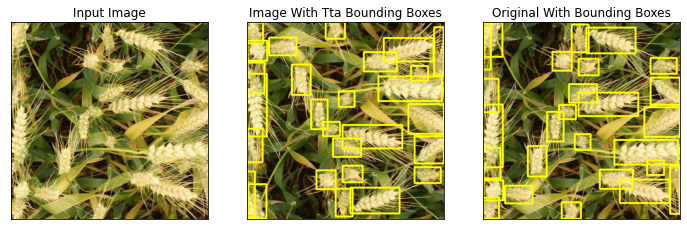

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


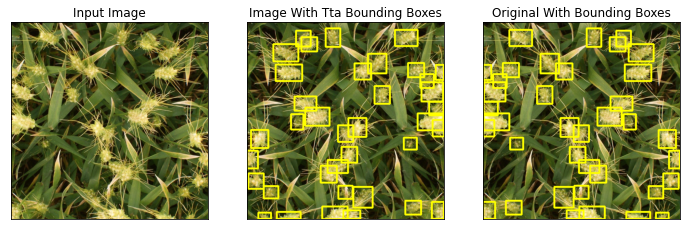

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


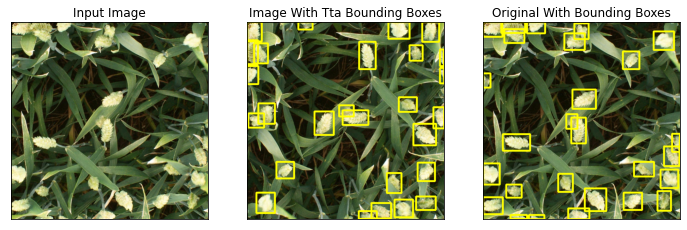

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


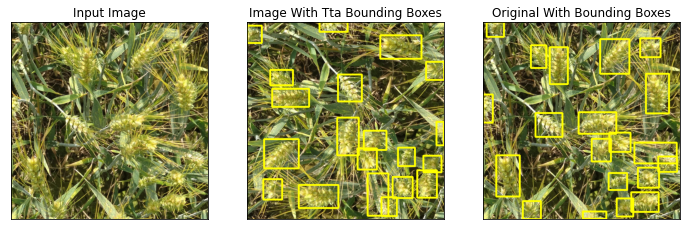

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


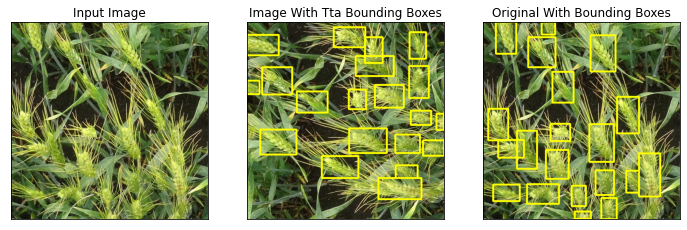

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


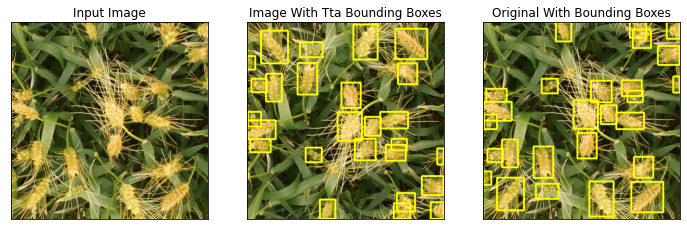

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


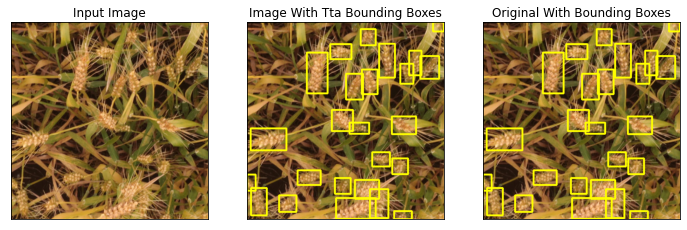

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


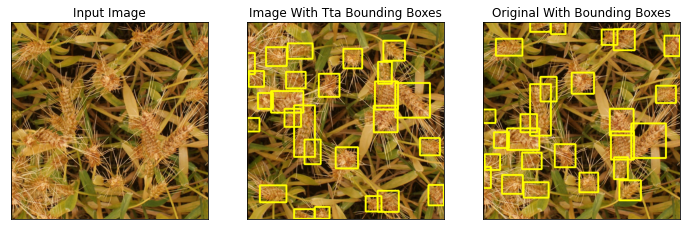

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


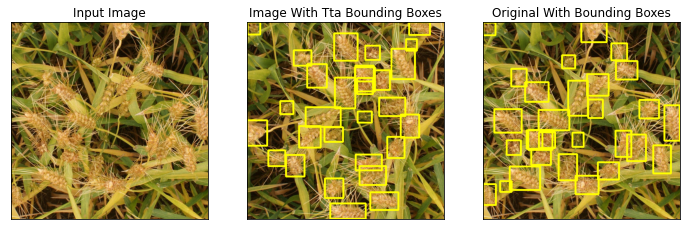

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


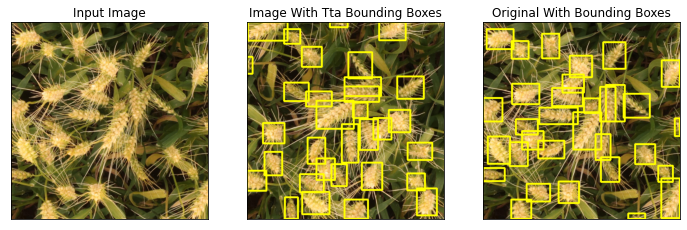

In [ ]:
for image_path in test_paths:
    img , tta_img , boxes , original_boxes = display_tta(image_path)
    original_with_boxes = visualizeTarget(img,{"boxes": original_boxes},visualize_data_loader = False)
    tta_with_boxes = visualizeTarget(tta_img,{"boxes": boxes},visualize_data_loader = False)
    visualize(figure=[12,12],input_image = img, image_with_tta_bounding_boxes = tta_with_boxes , original_with_bounding_boxes = original_with_boxes)


In [ ]:
def format_prediction_string(boxes, scores):
    pred_strings = []
    for row in zip(scores, boxes):
        score , x_min , y_min , x_max,y_max =row[0], row[1][0], row[1][1], row[1][2], row[1][3]
        x = round(x_min)
        y = round(y_min)
        h = round(x_max-x_min)
        w = round(y_max-y_min)
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(score, x , y , h , w))
    return " ".join(pred_strings)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


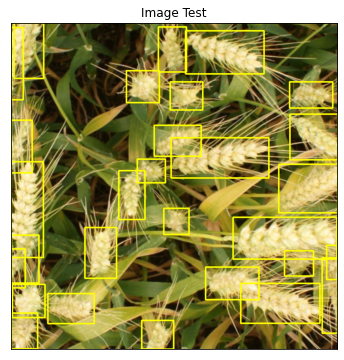

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


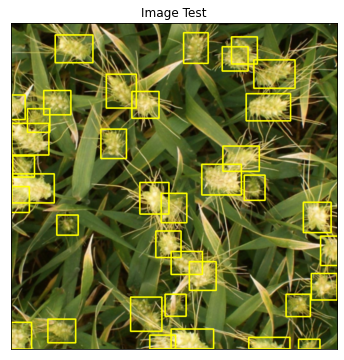

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


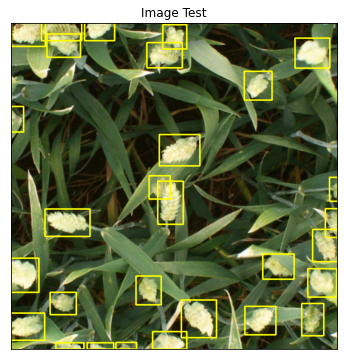

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


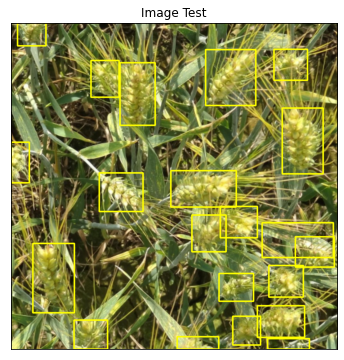

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


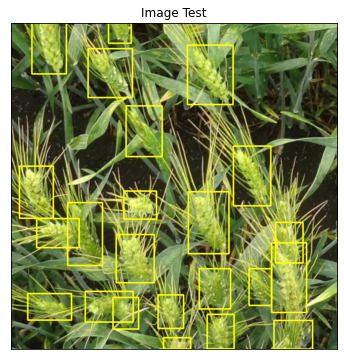

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


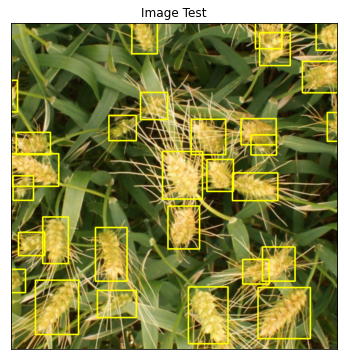

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


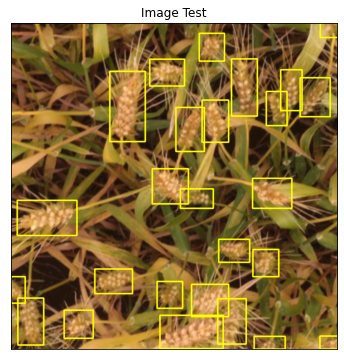

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


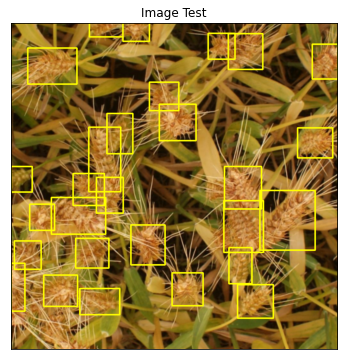

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


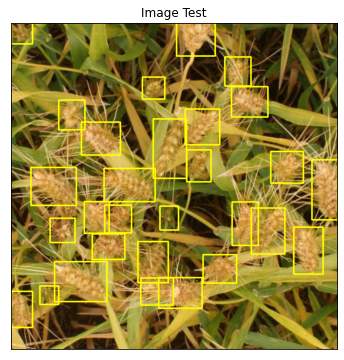

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


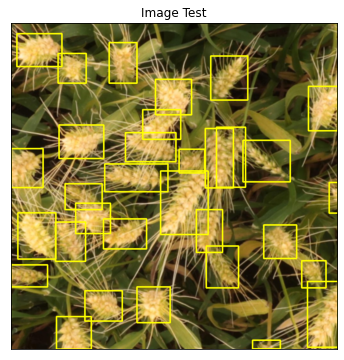

In [ ]:
model.cuda()
model.eval()

iou_thr = 0.4
detection_threshold = 0.5
n = 20

submission = []

for image_path in tqdm(test_paths):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) 
    image /= 255.0
    t = Compose([Resize(width=512,height=512),ToTensorV2()])
    data = { "image": image}
    data = t(**data)
    image = data["image"]
    image = image.squeeze(0)
   
    predictions = []
    
    for i in range(n):
        selected_tta = random.choice(tta_transforms)
        tta_image = selected_tta.augment(image)
        outputs = model(tta_image.unsqueeze(0).cuda())
        boxes = outputs[0]['boxes'].data.detach().cpu().numpy()
        scores = outputs[0]['scores'].data.detach().cpu().numpy()
        boxes = boxes[scores >= detection_threshold]
        scores = scores[scores >= detection_threshold]
        original_boxes  = selected_tta.deaugment_boxes(boxes)
        predictions.append({"boxes"  : original_boxes,'scores': scores})
    
    boxes, scores, labels = run_wbf(predictions,iou_thr=iou_thr,image_size=512)
    
        
    image = image.permute(1,2,0).detach().cpu().numpy()
    image = cv2.resize(image,(1024,1024))
    boxes = boxes * 1024.0
    original_with_boxes = visualizeTarget(image,{"boxes": boxes} , visualize_data_loader = False)
    visualize(figure=(6,6),image_test=original_with_boxes)

    prediction_string = format_prediction_string(boxes, scores)
    
    image_name = image_path.split("/")[-1].split(".")[0]
    submission.append([image_name, prediction_string])

# **Submission**

In [ ]:
SUBMISSION_PATH = '/content/drive/My Drive/Global Wheat Detection/submission'
submission_id = 'submission'
submission_path = os.path.join(SUBMISSION_PATH, '{}.csv'.format(submission_id))
sample_submission = pd.DataFrame(submission, columns=["image_id","PredictionString"])
sample_submission.to_csv(submission_path, index=False)
submission_df = pd.read_csv(submission_path)
submission_df

,image_id,PredictionString
0,51b3e36ab,0.9991 839.0 446.0 185.0 152.0 0.9990 546.0 28...
1,348a992bb,0.9980 736.0 225.0 139.0 85.0 0.9969 598.0 446...
2,2fd875eaa,0.9989 465.0 353.0 126.0 97.0 0.9988 392.0 796...
3,51f1be19e,0.9975 609.0 87.0 157.0 175.0 0.9955 500.0 465...
4,aac893a91,0.9985 556.0 531.0 127.0 194.0 0.9963 552.0 72...
5,cc3532ff6,0.9993 774.0 832.0 164.0 160.0 0.9978 379.0 0....
6,cb8d261a3,0.9969 756.0 489.0 124.0 94.0 0.9968 19.0 558....
7,796707dd7,0.9968 709.0 823.0 112.0 105.0 0.9964 898.0 33...
8,f5a1f0358,0.9981 943.0 431.0 81.0 189.0 0.9974 691.0 203...
9,53f253011,0.9981 932.0 202.0 92.0 139.0 0.9978 18.0 37.0...


# **Summary**

In this notebook we started with FasterRCNN model. 

As mentioned at the beginning of the notebook the data obtained from the train.csv file as well as the goals set in the competition led us to choose this model.


**Notebook steps:**

1.   Read train.csv file
2.   Augmentations

1.   Define Dataloader
2.   Train / Validation

1.   Load model
2.   Weighted Boxes Fusion 

1.   Test Time Augmentation

1.   Calculate score and prediction (Test)
2.   Create submission csv file



The first time we ran the notebook without augmentations we got a relatively low prediction so we decided to add augmentations to improve the training and even make the model better predict during validation (Validation loss decreased), which resulted in a significant improvement in bboxes prediction.

As a result, we decided to spend quite a bit of time choosing which augmentations are relevant to this type of training.

The model predicted a number of bboxes on wheat and following articles we read on the subject we came to the conclusion that using NMS will not help, this may eliminate "good"
boxes when objects are highly
overlapping… no good solution so we decided to use a method called WBF which can be seen extensively in the notebook.

We saw quite a few notebooks and recommendations to use TTA and realized that we should do that, because we have singel model on which we run the test set.
This approach is intended for situations where the amount of data in the test is relatively small for the training performed and in addition in a situation where there is a single model (Another explanation is described in this notebook).

Finally, the model receives a set of images and output for each them.

Outputs:

Boxes -  when the boxes indicate the coordinates in the format x, y, w, h.

Score - probability value between 0 and 1.

Label - to which category the box belongs.

In this notebook of **FasterRCNN** model we got the best score of **0.7112**

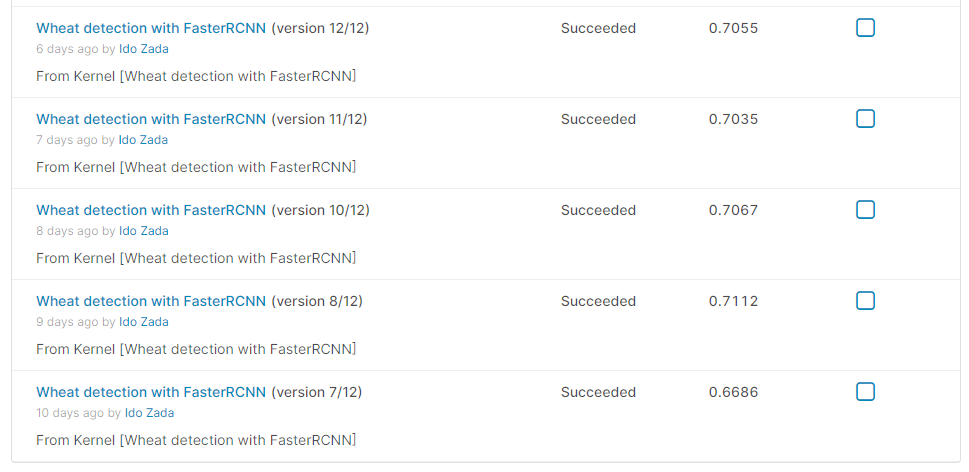

In this project we have been exposed to many methods and techniques for solving an object detection problem that we did not know.
Despite sleepless days and nights we learned a lot. The challenge in this competition caused us to improve the result and even proved to us that the theoretical part of the course will not only remain in theory but will be applied.
From day to day the motivation went up and unfortunately we reached the last day of the competition but this will probably not be the last competition we participate in.

Thank you for all the knowledge and time you have given us and hope to meet in the follow-up course.